## Coloured Image Histogram

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

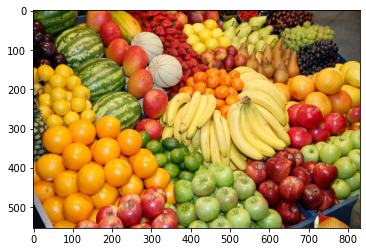

In [2]:
img = plt.imread('../week9/fruits.jpg')
plt.imshow(img)
plt.show()

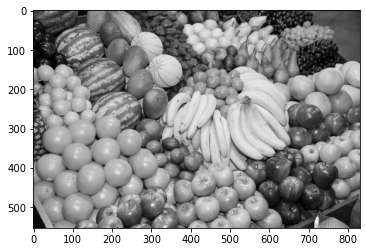

In [3]:
img_0 = cv2.imread('../week9/fruits.jpg',0)
plt.imshow(img_0,cmap='gray')
plt.show()

In [4]:
img_0.shape, img_0[0,0]

((553, 830), 53)

In [5]:
img.shape, img[0,0]

((553, 830, 3), array([45, 67,  3], dtype=uint8))

In [6]:
img[1,1]

array([46, 68,  4], dtype=uint8)

(array([3.9810e+03, 3.5320e+03, 4.4370e+03, 4.9450e+03, 5.7740e+03,
        5.7920e+03, 5.7650e+03, 5.8840e+03, 6.5810e+03, 6.7170e+03,
        8.1910e+03, 7.1360e+03, 7.5550e+03, 7.9330e+03, 9.1990e+03,
        1.0495e+04, 1.0663e+04, 1.0519e+04, 1.0315e+04, 9.9030e+03,
        1.1783e+04, 1.0156e+04, 1.0452e+04, 1.0860e+04, 1.1483e+04,
        1.2095e+04, 1.2543e+04, 1.3055e+04, 1.3517e+04, 1.3932e+04,
        1.7745e+04, 1.4823e+04, 1.5043e+04, 1.4988e+04, 1.5526e+04,
        1.5686e+04, 1.4410e+04, 1.3559e+04, 1.3416e+04, 1.2303e+04,
        1.2911e+04, 9.7480e+03, 9.4410e+03, 7.7840e+03, 5.0530e+03,
        1.0160e+03, 2.0100e+02, 9.2000e+01, 3.8000e+01, 1.4000e+01]),
 array([  0. ,   5.1,  10.2,  15.3,  20.4,  25.5,  30.6,  35.7,  40.8,
         45.9,  51. ,  56.1,  61.2,  66.3,  71.4,  76.5,  81.6,  86.7,
         91.8,  96.9, 102. , 107.1, 112.2, 117.3, 122.4, 127.5, 132.6,
        137.7, 142.8, 147.9, 153. , 158.1, 163.2, 168.3, 173.4, 178.5,
        183.6, 188.7, 193.8, 198.9

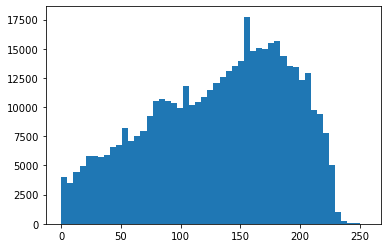

In [7]:
plt.hist(np.ravel(img_0), bins=50)

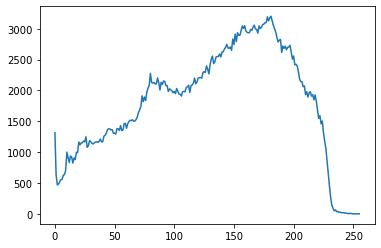

In [8]:
hist = cv2.calcHist([img_0], [0], None, [256], [0,256])
plt.plot(hist)
plt.show()

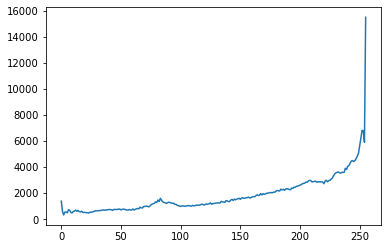

In [9]:
hist = cv2.calcHist([img], [0], None, [256], [0,256])
plt.plot(hist)
plt.show()

In [10]:
bpc = 8
bs = 256/bpc
H = np.zeros((np.power(bpc, 3)))
row, col = img.shape[0], img.shape[1]
for i in range(row):
    for j in range(col):
        R,G,B = img[i,j]
        r = int(R/bs) 
        g = int(G/bs) 
        b = int(B/bs)
        bi = r*bpc**2 + g*bpc + b
        H[bi] += 1 

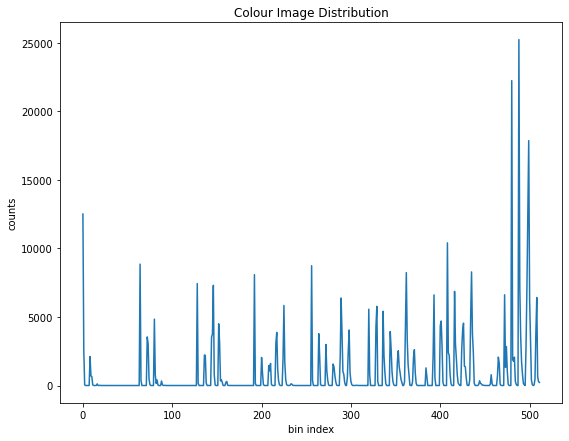

In [11]:
plt.figure(figsize=(9,7))
plt.plot(H)
plt.title('Colour Image Distribution')
plt.xlabel('bin index')
plt.ylabel('counts')
plt.show()

## Intrusion Detection

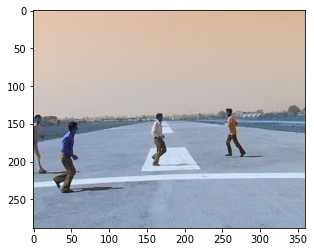

In [173]:
dir = 'Intrution_Detection-Dataset/Images/'
f = os.listdir(dir)[0]
img = cv2.imread(os.path.join(dir,f))
plt.imshow(img)
plt.show()

In [169]:
img.shape

(288, 360, 3)

In [166]:
def initBackground(initImage):
    mean = plt.imread(initImage)
    variance = 9*np.ones(mean.shape)
    return mean, variance

In [174]:
def foregroundDetection(img, mean, variance, lmda):
    I = np.square(img - mean) - (lmda**2)*variance
    mask = np.all(I>0, axis=2) # chebychev's check
    rI = 255*mask
    return rI.astype(np.uint8)

In [175]:
def voting(rI,eta,m,n):
    r, c = rI.shape
    cI = np.zeros(rI.shape)
    for i in range(m, r-1-m):
        for j in range(n, c-1-n):
            img_patch = rI[i-m:i, j-n:j]
            y_unq, counts = np.unique(img_patch, return_counts=True)
            if len(counts) == 1 and y_unq[0] == 1:
                cI[i,j] = 255
            if len(counts)>1:
                if counts[1] > eta*m*n:
                    cI[i,j] = 255
    return cI.astype(np.uint8)

In [176]:
def meanvarUpdate(cI, img, M, V, alpha):
    mean_upd = np.zeros(img.shape)
    var_upd = np.zeros(img.shape)
    d = np.square(img - M)
    for i in range(cI.shape[0]):
        for j in range(cI.shape[1]):
            if cI[i,j] == 0:
                mean_upd[i,j,:] = (1-alpha)*M[i,j,:] + alpha*img[i,j,:]
                var_upd[i,j,:] = (1-alpha)*(V[i,j,:] + alpha*d[i,j,:])
                var_upd[i,j,:] = np.clip(var_upd[i,j,:], a_min=9, a_max=None)
    return mean_upd, var_upd

In [179]:
def Background_Subtraction(img_dir,lmda,eta,m,n,alpha):
    files = sorted(os.listdir(img_dir))
    initImage = os.path.join(img_dir, files[0])
    mean, variance = initBackground(initImage)

    for i in range(1,20):
        img_path = os.path.join(img_dir,files[i])
        img = cv2.imread(img_path)

        fig, ax = plt.subplots(1,3,figsize=(20,10))
        rI = foregroundDetection(img, mean, variance, lmda)
        ax[0].imshow(rI, cmap='gray')
        ax[0].axis('off')
        ax[0].set_title('mask')

        cI = voting(rI,eta,m,n)
        mean,variance = meanvarUpdate(cI,img,mean,variance,alpha)
        ax[1].imshow(cI, cmap='gray')
        ax[1].axis('off')
        ax[1].set_title('background removed')

        ax[2].imshow(img)
        ax[2].axis('off')
        ax[2].set_title('frame')
        plt.show()
    return mean, variance

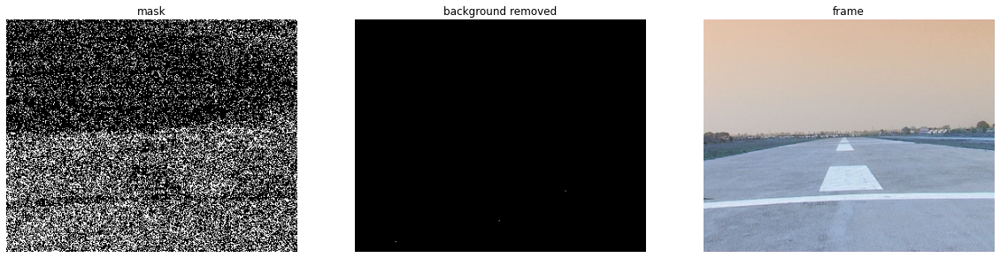

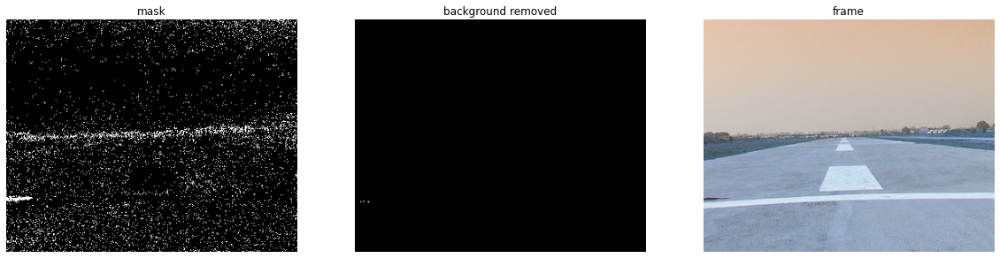

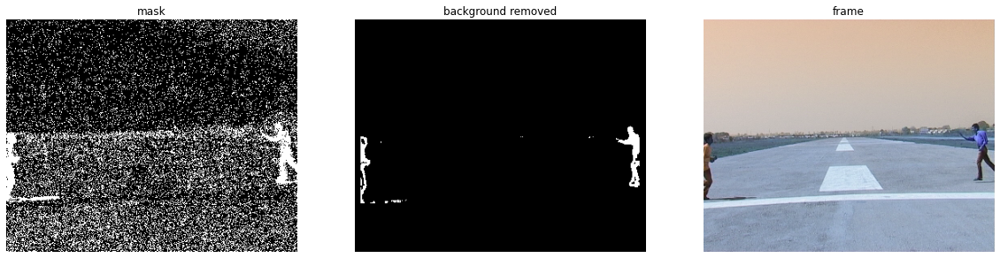

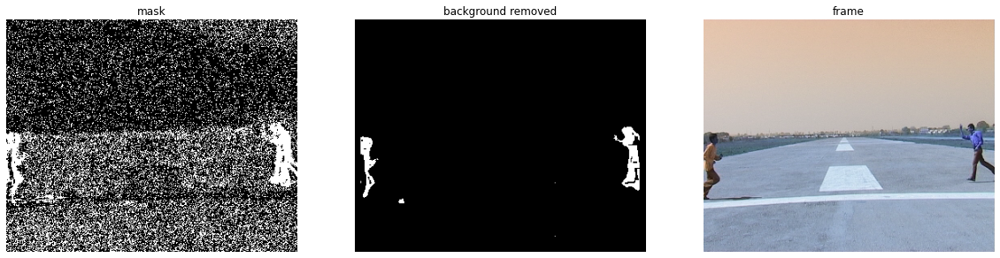

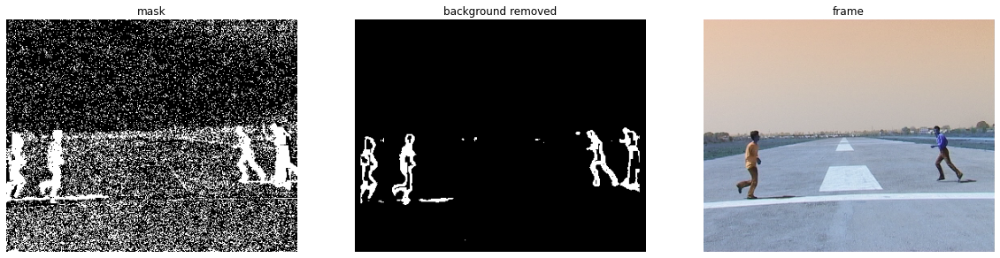

...

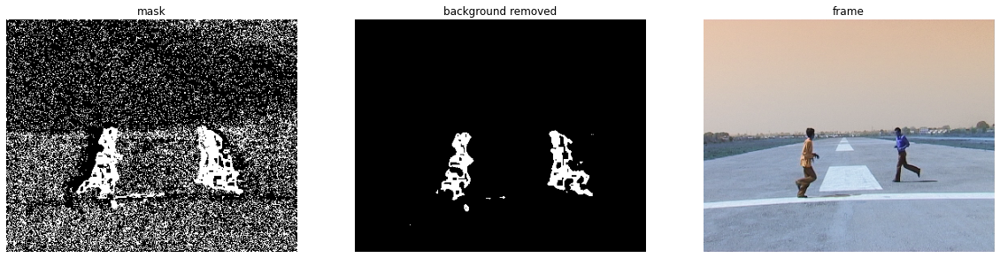

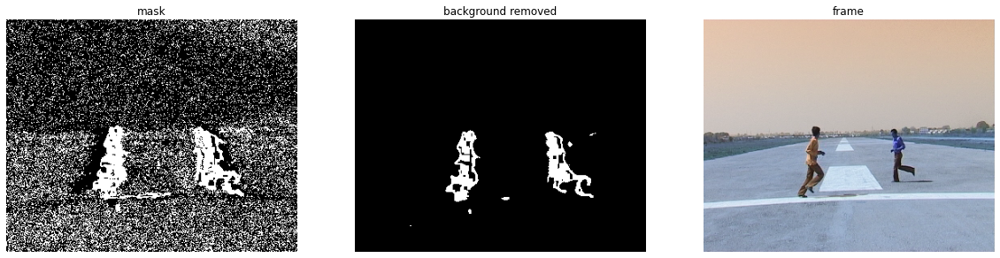

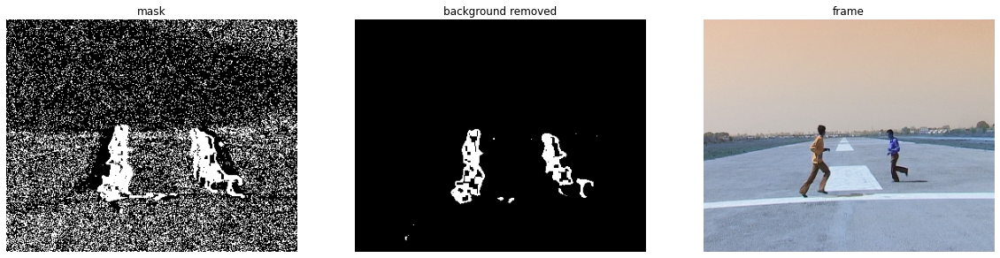

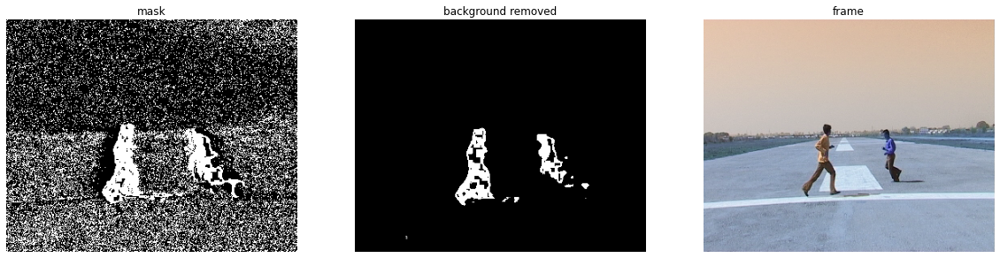

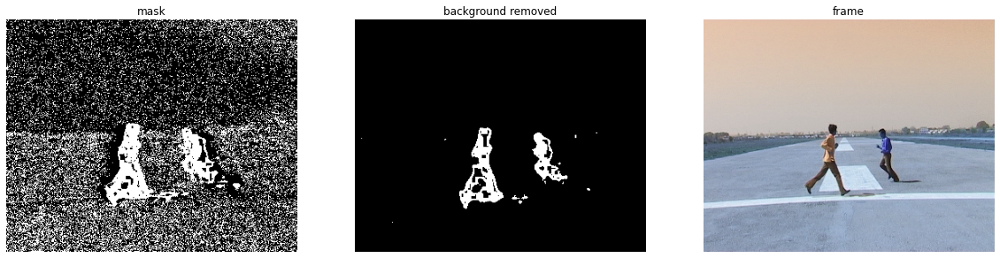

In [180]:
img_dir = 'Intrution_Detection-Dataset/Images/'
mean, variance = Background_Subtraction(img_dir=img_dir, lmda=0.8, eta=0.7, m=7, n=7, alpha=0.9)

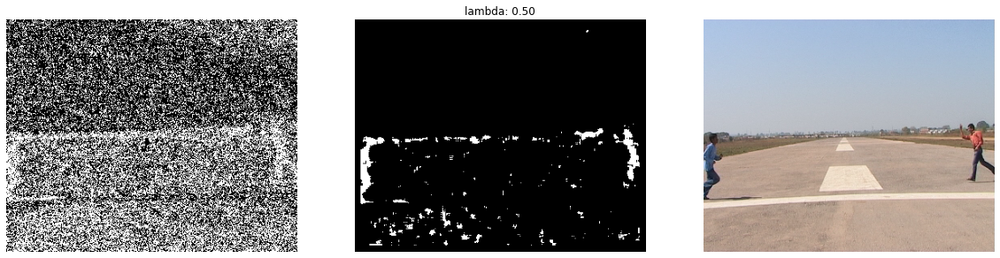

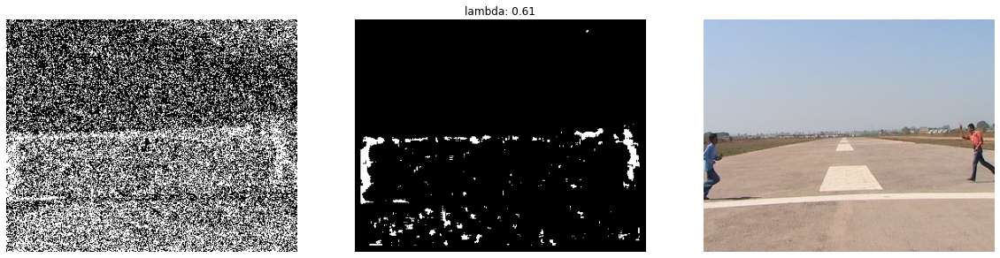

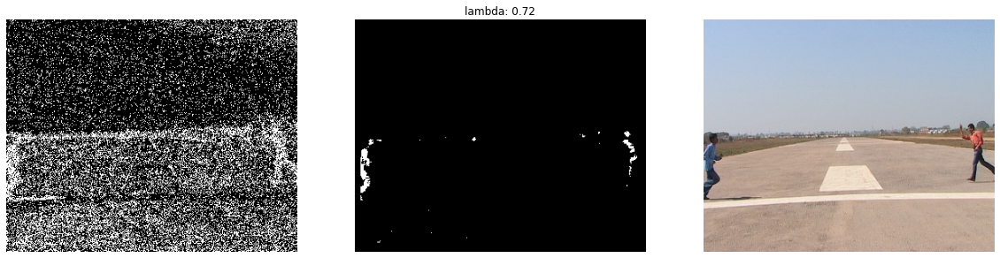

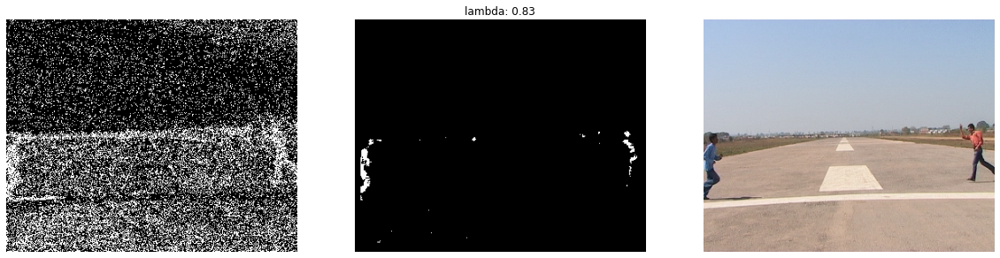

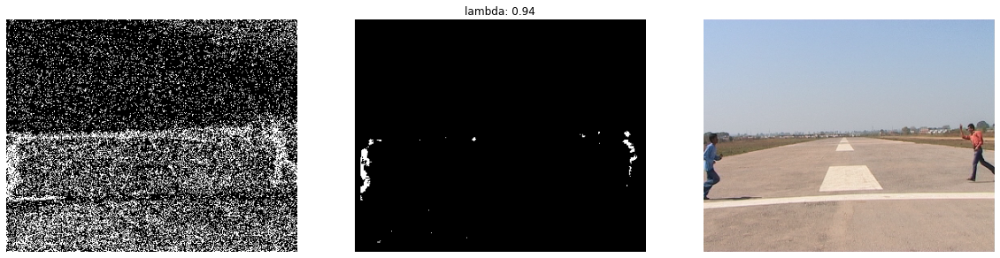

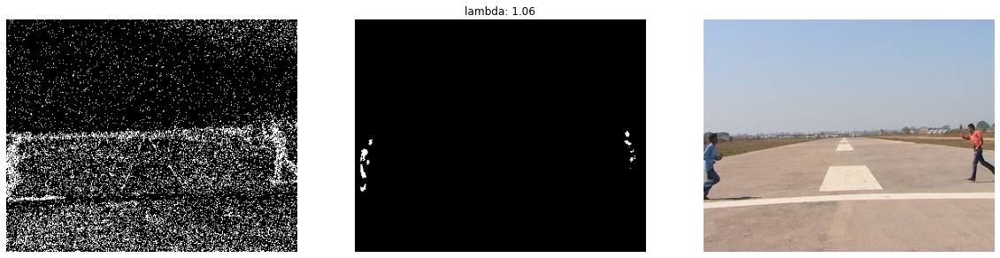

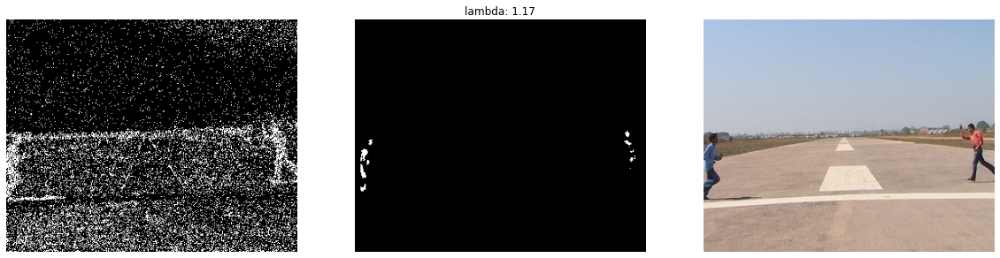

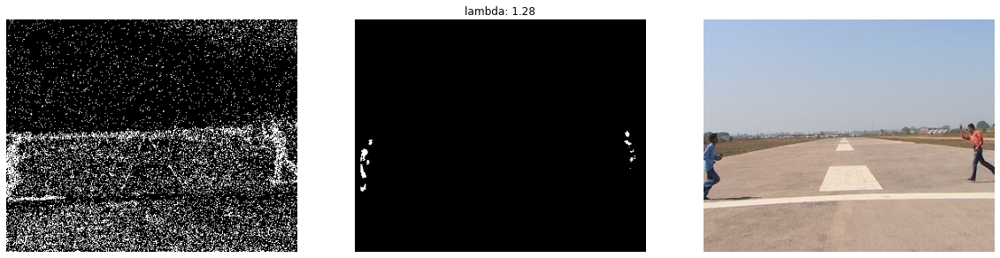

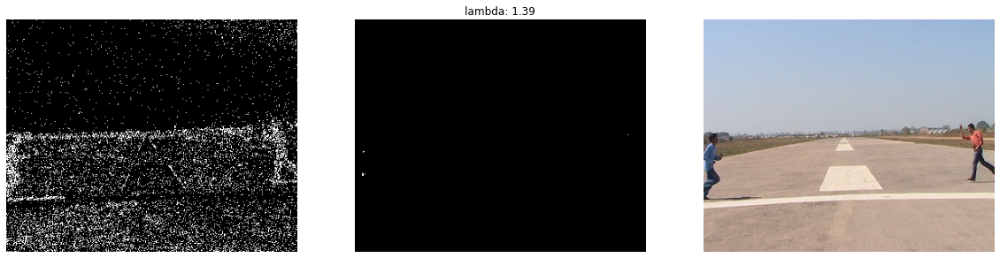

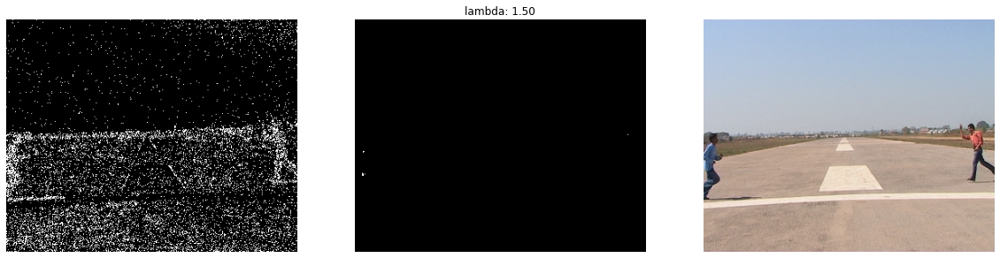

In [183]:
## varying lambda
img_file = "./Intrution_Detection-Dataset/Images/AirstripRunAroundFeb2006_1312.bmp"
truth = "./Intrution_Detection-Dataset/BakSubGroundTruth/groundMono1312.bmp"
lmda_arr = np.linspace(0.5,1.5,10)
m,n = 7,7
eta = 0.7; alpha = 0.8
files = sorted(os.listdir(img_dir))
initImage = os.path.join(img_dir, files[0])
mean, variance = initBackground(initImage)
for i in range(len(lmda_arr)):
    fig, ax = plt.subplots(1,3, figsize=(20,10))
    img = plt.imread(img_file)
    rI = foregroundDetection(img, mean, variance, lmda_arr[i])
    ax[0].imshow(rI, cmap='gray')
    ax[0].axis('off')

    cI = voting(rI, eta, m, n)
    ax[1].imshow(cI, cmap='gray')
    ax[1].set_title("lambda: {0:.2f}".format(lmda_arr[i]))
    ax[1].axis('off')

    img_truth = cv2.imread(truth)
    ax[2].imshow(img, cmap='gray')
    ax[2].axis('off')

    plt.show()

## Feature Learning using Spherical Clustering

In [184]:
def similarity(point, data):
    return np.dot(data, point)

In [185]:
def vec_norm(point):
    return point/np.linalg.norm(point)

In [186]:
class SphericalKMeans:
    def __init__(self, n_clusters=8, max_iter=100):
        self.n_cluster = n_clusters
        self.max_iter = max_iter

    def data_normalization(self, data):
        ## zero-centering and data normalization
        self.mu = np.mean(data, axis=0)
        data_0 = data - self.mu
        data_norm = np.array([vec_norm(d) for d in data_0])
        return data_norm

    def initialize_centroids_random(self, data):
        ## initialization of the centroids
        rand_idx = np.random.choice(data.shape[0], self.n_cluster, replace=False)
        self.centroids = [vec_norm(data[i]) for i in rand_idx]
    
    def initialize_centroids_blocks(self,data):
        ## initialization of the centroids by breaking into n_clusters blocks
        sorted_point = [[] for _ in range(self.n_cluster)]
        step = int(data.shape[0]/self.n_cluster)  ## dividing data into n_cluster blocks
        for i in range(self.n_cluster):
            sorted_point[i].append(data[:step])
            data = data[step+1:]
        self.centroids = [vec_norm(np.mean(cluster,axis=1)) for cluster in sorted_point]

    def fit(self,X_train):
        X_train = self.data_normalization(data=X_train)
        self.initialize_centroids_random(X_train)
        itr = 0
        prev_centroids = None
        while np.not_equal(self.centroids,prev_centroids).any() and itr<self.max_iter:
            sorted_points = [[] for _ in range(self.n_cluster)]
            for x in X_train:
                dot = similarity(x,self.centroids)
                centroid_idx = np.argmax(dot)
                sorted_points[centroid_idx].append(x)
            prev_centroids = self.centroids
            self.centroids = [vec_norm(np.mean(cluster,axis=0)) for cluster in sorted_points]
            for i,centroid in enumerate(self.centroids):
                if np.isnan(centroid).any():
                    self.centroids[i]=prev_centroids[i]
            itr +=1
        
    def evaluate(self, X):
        ## function to evaluate the cluster label of any data 
        centroids = []
        centroids_idx_ls = []
        for x in X:
            dot = similarity(x, self.centroids)
            centroid_idx = np.argmax(dot)
            centroids.append(self.centroids[centroid_idx])
            centroids_idx_ls.append(centroid_idx)
        return centroids, centroids_idx_ls

In [221]:
## Bag of Words for the image patches
from sklearn.feature_extraction.image import extract_patches_2d
data_arr = []
train_folder = 'Train_images'
train_files = os.listdir(train_folder)
for i in range(len(train_files)):
    if train_files[i].endswith('.jpg'):
        file = os.path.join(train_folder, train_files[i])
        image_array = plt.imread(file)
        image_patches = extract_patches_2d(image_array, (7,7), max_patches=100, random_state=23)
        for j in range(len(image_patches)):
            patch_vec = np.ravel(image_patches[j])
            data_arr.append(patch_vec)
data_arr = np.array(data_arr)
print(data_arr.shape)

(2100, 147)


In [222]:
clustering = SphericalKMeans(n_clusters=3, max_iter=100)
clustering.fit(X_train=data_arr)

In [223]:
np.linalg.norm(clustering.centroids[2])

1.0

In [224]:
test_folder = "Test_Images"
img_files = os.listdir(test_folder)
fileName = np.random.choice(img_files)
print(fileName)
filePath = os.path.join(test_folder, fileName)

test_img2.jpg


In [227]:
def testImage(img_path, centroids):
    img = plt.imread(img_path)
    image_patches = extract_patches_2d(img, (7,7), max_patches=10, random_state=23)
    feat_arr = []
    for i in range(len(image_patches)):
        feat_vec = []
        patch_vec = np.ravel(image_patches[i])
        for j in range(len(centroids)):
            v = np.dot(vec_norm(patch_vec),centroids[j])
            g = (1+v)/2
            feat_vec.append(g)
        feat_arr.append(vec_norm(feat_vec))
    return np.array(feat_arr)

In [228]:
feat_arr = testImage(filePath, clustering.centroids)
feat_arr

array([[0.41334296, 0.01054341, 0.91051438],
       [0.51338943, 0.01609659, 0.85800477],
       [0.54668796, 0.01666158, 0.83717063],
       [0.39674616, 0.01060502, 0.9178671 ],
       [0.39723827, 0.01130316, 0.9176459 ],
       [0.56159651, 0.02390575, 0.82706582],
       [0.39539886, 0.01137197, 0.91843912],
       [0.57431734, 0.02304171, 0.81830842],
       [0.59782861, 0.02715845, 0.80116376],
       [0.59026518, 0.02637033, 0.80677855]])

## Image Segmentation using KMeans

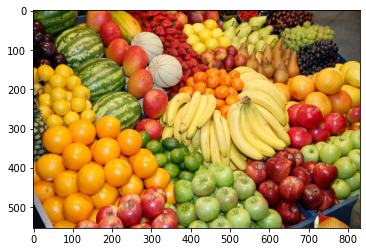

In [229]:
from sklearn.cluster import KMeans

img = plt.imread('../week9/fruits.jpg')
plt.imshow(img)
plt.show()

In [230]:
img.shape

(553, 830, 3)

In [231]:
img_arr = img.reshape(img.shape[0]*img.shape[1],img.shape[2])
img_arr.shape

(458990, 3)

In [258]:
K = 5
clus = KMeans(n_clusters=K, max_iter=1000)
clus.fit(img_arr)

KMeans(max_iter=1000, n_clusters=5)

In [259]:
def segmentImage(img, label_arr, centroids):
    seg_img = np.zeros(img.shape)
    for i in range(seg_img.shape[0]):
        for j in range(seg_img.shape[1]):
            k = int(label_arr[i,j])
            seg_img[i,j,:] = centroids[k]
    seg_img = seg_img.astype(np.uint8)
    return seg_img

In [260]:
labels = clus.labels_
label_arr = labels.reshape(img.shape[0],img.shape[1])
centroids = clus.cluster_centers_

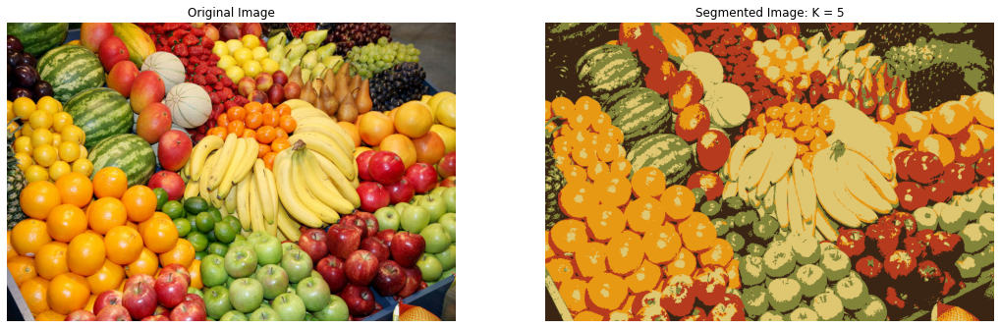

In [261]:
seg_img = segmentImage(img=img, label_arr=label_arr, centroids=centroids)
fig, ax = plt.subplots(1,2,figsize=(18,7))
ax[0].imshow(img)
ax[0].axis('off')
ax[0].set_title("Original Image")

ax[1].imshow(seg_img)
ax[1].axis('off')
ax[1].set_title("Segmented Image: K = {}".format(K))
plt.show()